In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
import numpy as np  # Importing NumPy for numerical operations
import re  # Importing 're' for regular expressions
import pandas as pd  # Importing Pandas for data manipulation
from matplotlib import pyplot as plt  # Importing Matplotlib for plotting
from sklearn.impute import SimpleImputer  # Importing SimpleImputer for imputation
from sklearn.model_selection import train_test_split  # Importing train_test_split for splitting data
from sklearn.svm import SVC  # Importing Support Vector Classifier
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier  # Importing RandomForest models
from __future__ import unicode_literals  # Importing unicode_literals for future compatibility
from imblearn.combine import SMOTETomek  # Importing SMOTETomek for oversampling
from math import *  # Importing math module
from sklearn.model_selection import cross_validate, cross_val_score  # Importing cross-validation functions
from sklearn.metrics import roc_curve, roc_auc_score  # Importing ROC curve metrics
from IPython.core import display as ICD  # Importing display module from IPython.core
from xgboost import XGBRegressor, XGBClassifier  # Importing XGBoost models
from catboost import CatBoostRegressor, CatBoostClassifier  # Importing CatBoost models
from lightgbm import LGBMClassifier, LGBMRegressor  # Importing LightGBM models
from imblearn.over_sampling import SMOTE  # Importing SMOTE for oversampling
from sklearn.metrics import recall_score, precision_score  # Importing recall and precision scores
from holidays import CountryHoliday  # Importing CountryHoliday for handling holidays
from imblearn.combine import SMOTEENN  # Importing SMOTEENN for oversampling
from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV, LogisticRegression, ElasticNet  # Importing linear models
from sklearn.ensemble import BaggingRegressor, GradientBoostingRegressor, AdaBoostRegressor  # Importing ensemble models
from sklearn.ensemble import BaggingClassifier, GradientBoostingClassifier, AdaBoostClassifier  # Importing ensemble classifiers
from sklearn.svm import SVR  # Importing Support Vector Regressor
from sklearn.model_selection import GridSearchCV  # Importing GridSearchCV for hyperparameter tuning
import eli5  # Importing eli5 for feature importance visualization
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier  # Importing KNeighbors models
from sklearn.preprocessing import LabelEncoder  # Importing LabelEncoder for encoding categorical variables
from sklearn.neighbors import NearestCentroid  # Importing NearestCentroid for nearest centroid classification
from sklearn.metrics import classification_report, f1_score, accuracy_score, confusion_matrix  # Importing classification metrics
from sklearn.metrics import confusion_matrix  # Importing confusion_matrix again? Redundant import
from collections import Counter  # Importing Counter for counting occurrences
from sklearn.metrics import mean_squared_error, mean_absolute_error  # Importing regression metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler  # Importing scalers for data scaling
from sklearn.metrics import r2_score  # Importing R-squared metric
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor  # Importing DecisionTree models
from sklearn.ensemble import IsolationForest  # Importing IsolationForest for anomaly detection
from sklearn.base import BaseEstimator, TransformerMixin  # Importing base classes for defining custom transformers
from sklearn.pipeline import Pipeline  # Importing Pipeline for constructing a sequence of transformations
import matplotlib.gridspec as gridspec  # Importing gridspec for subplot layout
from sklearn.impute import KNNImputer  # Importing KNNImputer for imputation
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV  # Importing RandomizedSearchCV and GridSearchCV for hyperparameter tuning
import seaborn as sns  # Importing Seaborn for statistical data visualization
import warnings  # Importing warnings module
from warnings import simplefilter  # Importing simplefilter from warnings module
import ast  # Importing ast module for abstract syntax trees manipulation
import sklearn  # Importing sklearn module
import matplotlib.pyplot as plt  # Importing Matplotlib again? Redundant import
from IPython.display import display, HTML  # Importing display and HTML for displaying content in Jupyter notebook

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory
import os  # Importing os module for operating system functionalities
for dirname, _, filenames in os.walk('/kaggle/input'):  # Walking through the directory structure
    for filename in filenames:  # Iterating through files in each directory
        print(os.path.join(dirname, filename))  # Printing the path of each file

def create_scrollable_table(df, table_id, title):
    # Function to create a scrollable HTML table
    html = f'<h3>{title}</h3>'  # Adding title to the HTML
    html += f'<div id="{table_id}" style="height:200px; overflow:auto;">'  # Adding scrollable div
    html += df.to_html()  # Converting DataFrame to HTML table
    html += '</div>'  # Closing scrollable div
    return html  # Returning the HTML

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session


/opt/conda/lib/python3.10/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(
2024-02-20 13:41:32.756287: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-20 13:41:32.756383: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-20 13:41:32.928193: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


/kaggle/input/restaurant-revenue-prediction/train.csv.zip
/kaggle/input/restaurant-revenue-prediction/sampleSubmission.csv
/kaggle/input/restaurant-revenue-prediction/test.csv.zip


In [2]:
train_df = pd.read_csv(r"/kaggle/input/restaurant-revenue-prediction/train.csv.zip")
test_df = pd.read_csv(r"/kaggle/input/restaurant-revenue-prediction/test.csv.zip")

In [3]:
test_df["Type"] = test_df["Type"].replace("MB","DT")

In [4]:
train_df.describe

<bound method NDFrame.describe of       Id   Open Date        City  City Group Type  P1   P2   P3   P4  P5  ...  \
0      0  07/17/1999    İstanbul  Big Cities   IL   4  5.0  4.0  4.0   2  ...   
1      1  02/14/2008      Ankara  Big Cities   FC   4  5.0  4.0  4.0   1  ...   
2      2  03/09/2013  Diyarbakır       Other   IL   2  4.0  2.0  5.0   2  ...   
3      3  02/02/2012       Tokat       Other   IL   6  4.5  6.0  6.0   4  ...   
4      4  05/09/2009   Gaziantep       Other   IL   3  4.0  3.0  4.0   2  ...   
..   ...         ...         ...         ...  ...  ..  ...  ...  ...  ..  ...   
132  132  06/25/2008     Trabzon       Other   FC   2  3.0  3.0  5.0   4  ...   
133  133  10/12/2006       İzmir  Big Cities   FC   4  5.0  4.0  4.0   2  ...   
134  134  07/08/2006     Kayseri       Other   FC   3  4.0  4.0  4.0   2  ...   
135  135  10/29/2010    İstanbul  Big Cities   FC   4  5.0  4.0  5.0   2  ...   
136  136  09/01/2009    İstanbul  Big Cities   FC   4  5.0  3.0  5.0   2  .

In [5]:
from datetime import datetime, timedelta

In [6]:
train_df.head()

,Id,Open Date,City,City Group,Type,P1,P2,P3,P4,P5,...,P29,P30,P31,P32,P33,P34,P35,P36,P37,revenue
0,0,07/17/1999,İstanbul,Big Cities,IL,4,5.0,4.0,4.0,2,...,3.0,5,3,4,5,5,4,3,4,5653753.0
1,1,02/14/2008,Ankara,Big Cities,FC,4,5.0,4.0,4.0,1,...,3.0,0,0,0,0,0,0,0,0,6923131.0
2,2,03/09/2013,Diyarbakır,Other,IL,2,4.0,2.0,5.0,2,...,3.0,0,0,0,0,0,0,0,0,2055379.0
3,3,02/02/2012,Tokat,Other,IL,6,4.5,6.0,6.0,4,...,7.5,25,12,10,6,18,12,12,6,2675511.0
4,4,05/09/2009,Gaziantep,Other,IL,3,4.0,3.0,4.0,2,...,3.0,5,1,3,2,3,4,3,3,4316715.0


In [7]:
# Convert "Open Date" column to datetime format
train_df["Open Date"] = pd.to_datetime(train_df["Open Date"])
# Extract day, day name, month, and year from "Open Date"
train_df["Day"] = train_df["Open Date"].dt.day
train_df["Day_Name"] = train_df["Open Date"].dt.day_name()
train_df["Month"] = train_df["Open Date"].dt.month
train_df["Years"] = train_df["Open Date"].dt.year
# Calculate the duration between "Open Date" and a fixed date (2016-01-01) in days, months, and years
train_df["Lasting day"] = (pd.to_datetime(datetime(2016,1,1)) - train_df["Open Date"])/timedelta(days=1)
train_df["Lasting month"] = (pd.to_datetime(datetime(2016,1,1)) - train_df["Open Date"])/timedelta(days=30)
train_df["Lasting year"] = (pd.to_datetime(datetime(2016,1,1)) - train_df["Open Date"])/timedelta(days=365)

# Drop the original "Open Date" column
train_df.drop("Open Date", axis=1, inplace=True)

# Repeat the same operations for the test dataset
test_df["Open Date"] = pd.to_datetime(test_df["Open Date"])
test_df["Day"] = test_df["Open Date"].dt.day
test_df["Day_Name"] = test_df["Open Date"].dt.day_name()
test_df["Month"] = test_df["Open Date"].dt.month
test_df["Years"] = test_df["Open Date"].dt.year
test_df["Lasting day"] = (pd.to_datetime(datetime(2016,1,1)) - test_df["Open Date"])/timedelta(days=1)
test_df["Lasting month"] = (pd.to_datetime(datetime(2016,1,1)) - test_df["Open Date"])/timedelta(days=30)
test_df["Lasting year"] = (pd.to_datetime(datetime(2016,1,1)) - test_df["Open Date"])/timedelta(days=365)
test_df.drop("Open Date", axis=1, inplace=True)


In [8]:
train_df["revenue"]=np.log(train_df["revenue"])

In [9]:
null_values = train_df.isnull().sum()
html_null_values = create_scrollable_table(null_values.to_frame(), 'null_values', 'Null values in the dataset')
missing_percentage = (train_df.isnull().sum() / len(train_df))/100
html_missing_percentage = create_scrollable_table(missing_percentage.to_frame(), 'missing_percentage', 'Null values in the dataset')
display(HTML(html_null_values + html_missing_percentage))

,0
Id,0
City,0
City Group,0
Type,0
P1,0
P2,0
P3,0
P4,0
P5,0
P6,0


In [10]:
# List of column indices to apply square root transformation
SquareRoot = [1,6,7,8,9,10,11,12,14,15,16,17,18,19,20,21,23,24,25,26,27,28,30,31,32,34,35,36]

# Iterate through each index in the list
for i in SquareRoot:
    # Generate column name based on index
    col = "P" + str(i)
    
    # Apply square root transformation to the corresponding column in train and test datasets
    train_df["Sqr" + str(i)] = np.sqrt(train_df[col])
    test_df["Sqr" + str(i)] = np.sqrt(test_df[col])
    
    # Drop the original column from both datasets
    train_df.drop(col, axis=1, inplace=True)
    test_df.drop(col, axis=1, inplace=True)


In [11]:
train_df.head(20)

,Id,City,City Group,Type,P2,P3,P4,P5,P13,P22,...,Sqr25,Sqr26,Sqr27,Sqr28,Sqr30,Sqr31,Sqr32,Sqr34,Sqr35,Sqr36
0,0,İstanbul,Big Cities,IL,5.0,4.0,4.0,2,5.0,3,...,1.000000,1.000000,2.000000,1.414214,2.236068,1.732051,2.000000,2.236068,2.000000,1.732051
1,1,Ankara,Big Cities,FC,5.0,4.0,4.0,1,5.0,3,...,0.000000,0.000000,0.000000,1.732051,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2,Diyarbakır,Other,IL,4.0,2.0,5.0,2,5.0,1,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,3,Tokat,Other,IL,4.5,6.0,6.0,4,7.5,1,...,1.414214,1.581139,1.581139,1.581139,5.000000,3.464102,3.162278,4.242641,3.464102,3.464102
4,4,Gaziantep,Other,IL,4.0,3.0,4.0,2,5.0,2,...,1.732051,1.732051,2.236068,1.000000,2.236068,1.000000,1.732051,1.732051,2.000000,1.732051
5,5,Ankara,Big Cities,FC,6.0,4.5,7.5,8,6.0,1,...,0.000000,0.000000,0.000000,2.738613,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,6,İstanbul,Big Cities,IL,3.0,4.0,4.0,1,5.0,2,...,2.000000,2.000000,2.236068,1.000000,2.000000,2.236068,1.414214,1.732051,2.236068,2.000000
7,7,İstanbul,Big Cities,IL,5.0,4.0,5.0,2,4.0,4,...,0.000000,0.000000,0.000000,1.732051,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,8,Afyonkarahisar,Other,IL,1.0,4.0,4.0,1,5.0,1,...,2.000000,2.000000,1.414214,1.414214,2.000000,2.236068,2.236068,2.000000,2.236068,2.000000
9,9,Edirne,Other,IL,4.5,6.0,7.5,6,7.5,1,...,0.000000,0.000000,0.000000,2.236068,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [12]:
numerical_features = train_df.select_dtypes(include=[np.number])
summary_stats = numerical_features.describe().T
html_numerical = create_scrollable_table(summary_stats, 'numerical_features', 'Summary statistics for numerical features')
display(HTML(html_numerical))

,count,mean,std,min,25%,50%,75%,max
Id,137.0,68.000000,39.692569,0.000000,34.000000,68.000000,102.000000,136.000000
P2,137.0,4.408759,1.514900,1.000000,4.000000,5.000000,5.000000,7.500000
P3,137.0,4.317518,1.032337,0.000000,4.000000,4.000000,5.000000,7.500000
P4,137.0,4.372263,1.016462,3.000000,4.000000,4.000000,5.000000,7.500000
P5,137.0,2.007299,1.209620,1.000000,1.000000,2.000000,2.000000,8.000000
P13,137.0,5.080292,1.036527,3.000000,5.000000,5.000000,5.000000,7.500000
P22,137.0,2.226277,1.230690,1.000000,1.000000,2.000000,3.000000,5.000000
P29,137.0,3.135036,1.680887,0.000000,2.500000,3.000000,3.000000,7.500000
P33,137.0,1.138686,1.698540,0.000000,0.000000,0.000000,2.000000,6.000000
P37,137.0,1.116788,1.790768,0.000000,0.000000,0.000000,2.000000,8.000000


In [13]:
categorical_features = train_df.select_dtypes(include=[object])
summary_stats = categorical_features.describe().T
html_numerical = create_scrollable_table(summary_stats, 'categorical_features', 'Summary statistics for categorical features')
display(HTML(html_numerical))

,count,unique,top,freq
City,137,34,İstanbul,50
City Group,137,2,Big Cities,78
Type,137,3,FC,76
Day_Name,137,7,Saturday,31


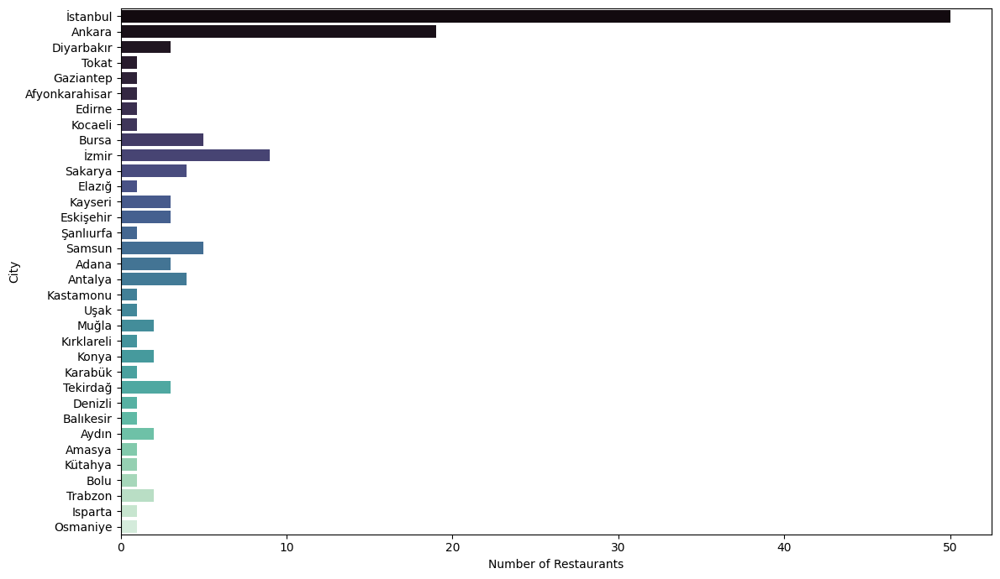

In [14]:
# Create a new figure with a specific size for the plot
plt.figure(figsize=(12,7))

# Plot a countplot of the "City" column from the train_df DataFrame
# using seaborn's countplot function, specifying the palette for the plot
sns.countplot(y=train_df["City"], palette="mako")

# Set the label for the x-axis
plt.xlabel("Number of Restaurants")

# Adjust the layout to ensure all elements fit properly
plt.tight_layout()


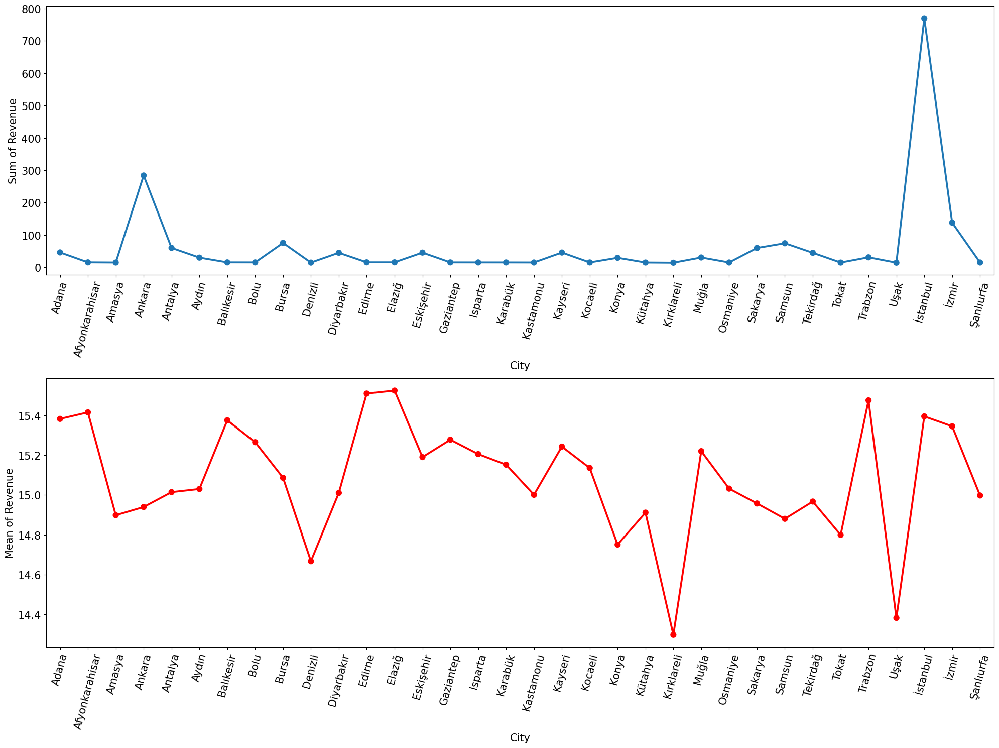

In [15]:
# Group the train_df DataFrame by "City" and calculate the mean and sum of "revenue" for each city,
# then reset the index to make the resulting DataFrame suitable for plotting
city_df = train_df.groupby("City")["revenue"].agg(["mean", "sum"]).reset_index()

# Create a new figure with two subplots arranged vertically and a specific size
fig, ax = plt.subplots(2, 1, figsize=(20, 15))

# Plot the sum of revenue for each city using a point plot on the first subplot
ax1 = sns.pointplot(x=city_df["City"], y=city_df["sum"], ax=ax[0])

# Customize x-axis tick labels: set size and rotation
ax1.tick_params(axis="x", labelsize=15, labelrotation=75)

# Customize y-axis tick labels: set size
ax1.tick_params(axis="y", labelsize=15)

# Set label for x-axis
ax1.set_xlabel("City", fontsize=15)

# Set label for y-axis
ax1.set_ylabel("Sum of Revenue", fontsize=15)

# Plot the mean of revenue for each city using a point plot on the second subplot, set color to red
ax2 = sns.pointplot(x=city_df["City"], y=city_df["mean"], ax=ax[1], color="r")

# Customize x-axis tick labels: set size and rotation
ax2.tick_params(axis="x", labelsize=15, labelrotation=75)

# Customize y-axis tick labels: set size
ax2.tick_params(axis="y", labelsize=15)

# Set label for x-axis
ax2.set_xlabel("City", fontsize=15)

# Set label for y-axis
ax2.set_ylabel("Mean of Revenue", fontsize=15)

# Adjust the layout to ensure all elements fit properly
plt.tight_layout()


In [16]:
# Replace specific city names in the "City" column of the train_df DataFrame with new city names
train_df["City"] = train_df["City"].replace("Tokat", "Samsun")
train_df["City"] = train_df["City"].replace("Gaziantep", "Diyarbakır")
train_df["City"] = train_df["City"].replace("Afyonkarahisar", "Ankara")
train_df["City"] = train_df["City"].replace("Edirne", "İstanbul")
train_df["City"] = train_df["City"].replace("Kocaeli", "İstanbul")
train_df["City"] = train_df["City"].replace("Urfa", "Diyarbakır")
train_df["City"] = train_df["City"].replace("Kastamonu", "Samsun")
train_df["City"] = train_df["City"].replace("Karabük", "Ankara")
train_df["City"] = train_df["City"].replace("Balıkesir", "İzmir")
train_df["City"] = train_df["City"].replace("Amasya", "Ankara")
train_df["City"] = train_df["City"].replace("Kütahya", "İzmir")
train_df["City"] = train_df["City"].replace("Bolu", "Ankara")
train_df["City"] = train_df["City"].replace("Isparta", "Antalya")
train_df["City"] = train_df["City"].replace("Osmaniye", "Ankara")
train_df["City"] = train_df["City"].replace("Konya", "Ankara")
train_df["City"] = train_df["City"].replace("Kayseri", "Ankara")
train_df["City"] = train_df["City"].replace("Eskişehir", "Ankara")
train_df["City"] = train_df["City"].replace("Elazığ", "Diyarbakır")
train_df["City"] = train_df["City"].replace("Şanlıurfa", "Diyarbakır")
train_df["City"] = train_df["City"].replace("Muğla", "İzmir")
train_df["City"] = train_df["City"].replace("Kırklareli", "İstanbul")
train_df["City"] = train_df["City"].replace("Uşak", "Ankara")
train_df["City"] = train_df["City"].replace("Sakarya", "İstanbul")
train_df["City"] = train_df["City"].replace("Tekirdağ", "İstanbul")
train_df["City"] = train_df["City"].replace("Denizli", "İzmir")
train_df["City"] = train_df["City"].replace("Aydın", "İzmir")
train_df["City"] = train_df["City"].replace("Trabzon", "Samsun")
train_df["City"] = train_df["City"].replace("Bursa", "İstanbul")
train_df["City"] = train_df["City"].replace("Adana", "Antalya")
train_df["City"] = train_df["City"].replace("Samsun", "Ankara")
train_df["City"] = train_df["City"].replace("Diyarbakır", "Ankara")
train_df["City"] = train_df["City"].replace("Antalya", "İzmir")


In [17]:
# Replace specific city names in the "City" column of the test_df DataFrame with new city names
test_df["City"] = test_df["City"].replace("Tokat", "Samsun")
test_df["City"] = test_df["City"].replace("Gaziantep", "Diyarbakır")
test_df["City"] = test_df["City"].replace("Afyonkarahisar", "Ankara")
test_df["City"] = test_df["City"].replace("Edirne", "İstanbul")
test_df["City"] = test_df["City"].replace("Kocaeli", "İstanbul")
test_df["City"] = test_df["City"].replace("Urfa", "Diyarbakır")
test_df["City"] = test_df["City"].replace("Kastamonu", "Samsun")
test_df["City"] = test_df["City"].replace("Karabük", "Ankara")
test_df["City"] = test_df["City"].replace("Balıkesir", "İzmir")
test_df["City"] = test_df["City"].replace("Amasya", "Ankara")
test_df["City"] = test_df["City"].replace("Kütahya", "İzmir")
test_df["City"] = test_df["City"].replace("Bolu", "Ankara")
test_df["City"] = test_df["City"].replace("Isparta", "Antalya")
test_df["City"] = test_df["City"].replace("Osmaniye", "Ankara")
test_df["City"] = test_df["City"].replace("Konya", "Ankara")
test_df["City"] = test_df["City"].replace("Kayseri", "Ankara")
test_df["City"] = test_df["City"].replace("Eskişehir", "Ankara")
test_df["City"] = test_df["City"].replace("Elazığ", "Diyarbakır")
test_df["City"] = test_df["City"].replace("Şanlıurfa", "Diyarbakır")
test_df["City"] = test_df["City"].replace("Muğla", "İzmir")
test_df["City"] = test_df["City"].replace("Kırklareli", "İstanbul")
test_df["City"] = test_df["City"].replace("Uşak", "Ankara")
test_df["City"] = test_df["City"].replace("Sakarya", "İstanbul")
test_df["City"] = test_df["City"].replace("Tekirdağ", "İstanbul")
test_df["City"] = test_df["City"].replace("Denizli", "İzmir")
test_df["City"] = test_df["City"].replace("Aydın", "İzmir")
test_df["City"] = test_df["City"].replace("Trabzon", "Samsun")
test_df["City"] = test_df["City"].replace("Bursa", "İstanbul")
test_df["City"] = test_df["City"].replace("Adana", "Antalya")
test_df["City"] = test_df["City"].replace("Samsun", "Ankara")
test_df["City"] = test_df["City"].replace("Diyarbakır", "Ankara")
test_df["City"] = test_df["City"].replace("Antalya", "İzmir")


In [18]:
# Replace specific city names in the "City" column of the test_df DataFrame with new city names
test_df["City"] = test_df["City"].replace("Aksaray", "Ankara")
test_df["City"] = test_df["City"].replace("Artvin", "Ankara")
test_df["City"] = test_df["City"].replace("Batman", "Ankara")
test_df["City"] = test_df["City"].replace("Bilecik", "İstanbul")
test_df["City"] = test_df["City"].replace("Düzce", "İstanbul")
test_df["City"] = test_df["City"].replace("Erzincan", "Ankara")
test_df["City"] = test_df["City"].replace("Erzurum", "Ankara")
test_df["City"] = test_df["City"].replace("Giresun", "Ankara")
test_df["City"] = test_df["City"].replace("Hatay", "Ankara")
test_df["City"] = test_df["City"].replace("Kahramanmaraş", "Ankara")
test_df["City"] = test_df["City"].replace("Kars", "Ankara")
test_df["City"] = test_df["City"].replace("Kırıkkale", "Ankara")
test_df["City"] = test_df["City"].replace("Kırşehir", "Ankara")
test_df["City"] = test_df["City"].replace("Malatya", "Ankara")
test_df["City"] = test_df["City"].replace("Manisa", "İzmir")
test_df["City"] = test_df["City"].replace("Mardin", "Ankara")
test_df["City"] = test_df["City"].replace("Mersin", "Ankara")
test_df["City"] = test_df["City"].replace("Nevşehir", "Ankara")
test_df["City"] = test_df["City"].replace("Niğde", "Ankara")
test_df["City"] = test_df["City"].replace("Ordu", "Ankara")
test_df["City"] = test_df["City"].replace("Rize", "Ankara")
test_df["City"] = test_df["City"].replace("Siirt", "Ankara")
test_df["City"] = test_df["City"].replace("Sivas", "Ankara")
test_df["City"] = test_df["City"].replace("Yalova", "İstanbul")
test_df["City"] = test_df["City"].replace("Zonguldak", "İstanbul")
test_df["City"] = test_df["City"].replace("Çanakkale", "İstanbul")
test_df["City"] = test_df["City"].replace("Çankırı", "Ankara")
test_df["City"] = test_df["City"].replace("Çorum", "Ankara")
test_df["City"] = test_df["City"].replace("Tanımsız", "Ankara")


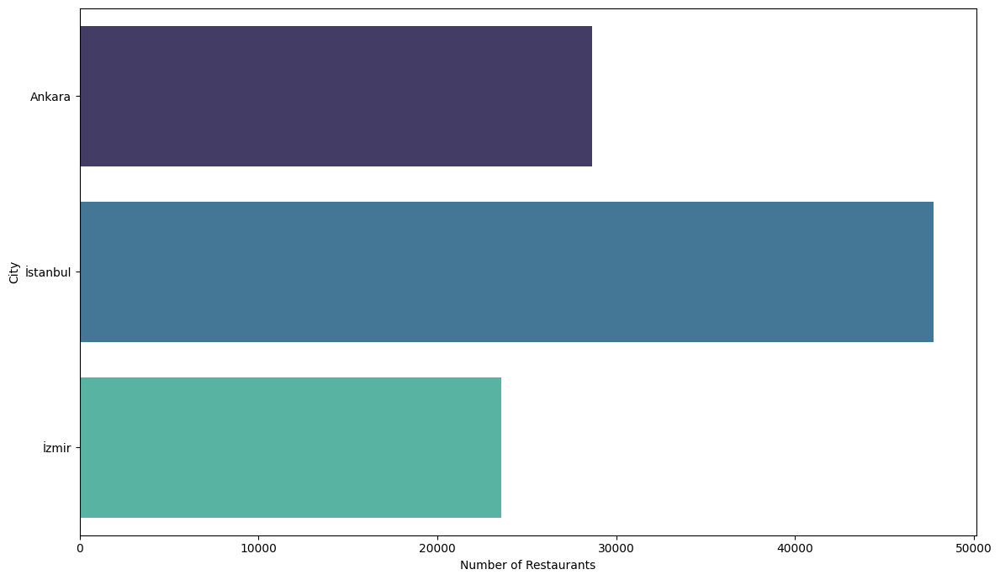

In [19]:
plt.figure(figsize=(12,7))
sns.countplot(y= test_df["City"],palette="mako")
plt.xlabel("Number of Restaurants")
plt.tight_layout()

In [20]:
one_hot_encoded_train = pd.get_dummies(train_df['City'])
one_hot_encoded_test = pd.get_dummies(test_df['City'])

In [21]:
train_df = pd.concat([train_df, one_hot_encoded_train], axis=1)
test_df = pd.concat([test_df, one_hot_encoded_test], axis=1)

In [22]:
train_df.head()

,Id,City,City Group,Type,P2,P3,P4,P5,P13,P22,...,Sqr28,Sqr30,Sqr31,Sqr32,Sqr34,Sqr35,Sqr36,Ankara,İstanbul,İzmir
0,0,İstanbul,Big Cities,IL,5.0,4.0,4.0,2,5.0,3,...,1.414214,2.236068,1.732051,2.000000,2.236068,2.000000,1.732051,False,True,False
1,1,Ankara,Big Cities,FC,5.0,4.0,4.0,1,5.0,3,...,1.732051,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,True,False,False
2,2,Ankara,Other,IL,4.0,2.0,5.0,2,5.0,1,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,True,False,False
3,3,Ankara,Other,IL,4.5,6.0,6.0,4,7.5,1,...,1.581139,5.000000,3.464102,3.162278,4.242641,3.464102,3.464102,True,False,False
4,4,Ankara,Other,IL,4.0,3.0,4.0,2,5.0,2,...,1.000000,2.236068,1.000000,1.732051,1.732051,2.000000,1.732051,True,False,False


In [23]:
train_df['Ankara'] = train_df['Ankara'].replace({True: 1, False: 0})
train_df['İstanbul'] = train_df['İstanbul'].replace({True: 1, False: 0})
train_df['İzmir'] = train_df['İzmir'].replace({True: 1, False: 0})

/tmp/ipykernel_27/409764011.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df['Ankara'] = train_df['Ankara'].replace({True: 1, False: 0})
/tmp/ipykernel_27/409764011.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df['İstanbul'] = train_df['İstanbul'].replace({True: 1, False: 0})
/tmp/ipykernel_27/409764011.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the

In [24]:
test_df['Ankara'] = test_df['Ankara'].replace({True: 1, False: 0})
test_df['İstanbul'] = test_df['İstanbul'].replace({True: 1, False: 0})
test_df['İzmir'] = test_df['İzmir'].replace({True: 1, False: 0})

/tmp/ipykernel_27/3581825031.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_df['Ankara'] = test_df['Ankara'].replace({True: 1, False: 0})
/tmp/ipykernel_27/3581825031.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_df['İstanbul'] = test_df['İstanbul'].replace({True: 1, False: 0})
/tmp/ipykernel_27/3581825031.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the 

In [25]:
def catch_cat_num(dataframe):
    # Find categorical columns with less than 4 unique values (excluding "group" column)
    cat = [col for col in dataframe.columns if dataframe[col].dtype == "object" and dataframe[col].nunique() < 4 and col != "group"]
    
    # Find categorical columns with 4 or more unique values (excluding "group" column)
    cardinal = [col for col in dataframe.columns if dataframe[col].dtype == "object" and dataframe[col].nunique() >= 4 and col != "group"]
    
    # Find numerical columns (excluding "Id" and "revenue" columns)
    nums = [col for col in dataframe.columns if (dataframe[col].dtype == "float" or dataframe[col].dtype == "int") and col != "Id" and col != "revenue"]
    
    return cat, cardinal, nums

# Call the function and store the results in variables cat, cardinal, and nums
cat, cardinal, nums = catch_cat_num(train_df)

# Print the results
print(cat)        # Categorical columns with less than 4 unique values
print(cardinal)   # Categorical columns with 4 or more unique values
print(nums)       # Numerical columns


['City', 'City Group', 'Type']
['Day_Name']
['P2', 'P3', 'P4', 'P5', 'P13', 'P22', 'P29', 'P33', 'P37', 'Lasting day', 'Lasting month', 'Lasting year', 'Sqr1', 'Sqr6', 'Sqr7', 'Sqr8', 'Sqr9', 'Sqr10', 'Sqr11', 'Sqr12', 'Sqr14', 'Sqr15', 'Sqr16', 'Sqr17', 'Sqr18', 'Sqr19', 'Sqr20', 'Sqr21', 'Sqr23', 'Sqr24', 'Sqr25', 'Sqr26', 'Sqr27', 'Sqr28', 'Sqr30', 'Sqr31', 'Sqr32', 'Sqr34', 'Sqr35', 'Sqr36', 'Ankara', 'İstanbul', 'İzmir']


In [26]:
# Initialize empty lists to store dominant features
dominance_cat = []
dominance_cardinal = []
dominance_num = []

# Define the dominance function
def dominance(df):
    # Define the threshold for dominance
    th = 0.8
    
    # Check for dominance in numerical columns
    for col in nums:
        dominant_num = df[col].value_counts() / len(df[col])
        if any(dominant_num > th):
            dominance_num.append(col)
    
    # Check for dominance in categorical columns with less than 4 unique values
    for col in cat:
        dominant_cat = df[col].value_counts() / len(df[col])
        if any(dominant_cat > th):
            dominance_cat.append(col)
    
    # Check for dominance in categorical columns with 4 or more unique values
    for col in cardinal:
        dominant_cardinal = df[col].value_counts() / len(df[col])
        if any(dominant_cardinal > th):
            dominance_cardinal.append(col)
    
    return dominance_cat, dominance_cardinal, dominance_num

# Call the dominance function on the train_df DataFrame and store the results
dominance_cat, dominance_cardinal, dominance_num = dominance(train_df)

# Print the results
print(dominance_cat)        # Dominant categorical columns with less than 4 unique values
print(dominance_cardinal)   # Dominant categorical columns with 4 or more unique values
print(dominance_num)        # Dominant numerical columns


[]
[]
['İzmir']


Highly Correlated Features with Revenue (Correlation > 0.8):
[]

Correlation with Revenue:
P2               0.218221
P3               0.017881
P4               0.072821
P5               0.008286
P13             -0.042842
P22              0.111167
P29             -0.043341
P33              0.031044
P37              0.047089
Lasting day      0.327601
Lasting month    0.327601
Lasting year     0.327601
Sqr1             0.145774
Sqr6             0.205104
Sqr7             0.132093
Sqr8            -0.031667
Sqr9             0.006078
Sqr10           -0.017359
Sqr11            0.111491
Sqr12            0.000511
Sqr14            0.068489
Sqr15            0.056521
Sqr16            0.035700
Sqr17            0.108959
Sqr18            0.046956
Sqr19            0.090438
Sqr20            0.104687
Sqr21            0.174779
Sqr23            0.125759
Sqr24            0.068880
Sqr25            0.086259
Sqr26            0.054568
Sqr27            0.049725
Sqr28            0.261093
Sqr30            0.002699

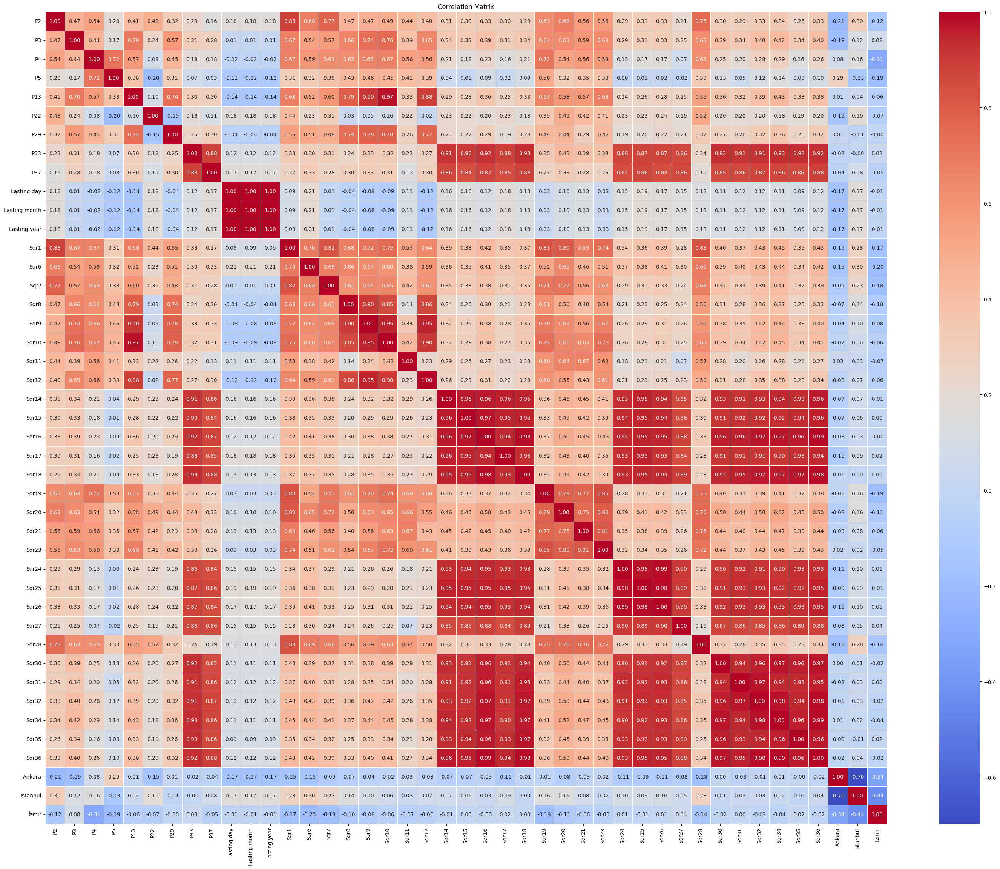

In [27]:
# Initialize an empty list to store features highly correlated with revenue
high_cor = []

# Define the correlation function
def correlation(df):
    # Set the threshold for high correlation
    th = 0.8
    
    # Calculate the correlation of numerical features with the "revenue" column
    corre = df[nums].corrwith(df["revenue"])
    
    # Calculate the correlation matrix of numerical features
    cor = df[nums].corr()
    
    # Check for features highly correlated with revenue
    for col in corre.index:
        if (corre[col] > th).any():
            high_cor.append(col)
    
    # Print highly correlated features with revenue
    print("Highly Correlated Features with Revenue (Correlation > {}):".format(th))
    print(high_cor)

    # Print correlation of numerical features with revenue
    print("\nCorrelation with Revenue:")
    print(corre)

    # Print correlation matrix of numerical features
    print("\nCorrelation Matrix:")
    print(cor)

    # Plot heatmap of the correlation matrix
    plt.figure(figsize=(36, 28))
    sns.heatmap(cor, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title("Correlation Matrix")
    plt.show()

# Call the correlation function on the train_df DataFrame
correlation(train_df)


In [28]:
# Calculate new features for train_df

# Calculate p1 as the mean of selected square root features
train_df["p1"] = train_df[["Sqr30", "Sqr32", "Sqr34", "Sqr35", "Sqr36"]].mean(axis=1)

# Calculate p2 as the mean of selected square root and numeric features
train_df["p2"] = train_df[["Sqr14", "Sqr16", "Sqr17", "Sqr18", "P22"]].mean(axis=1)

# Calculate p3 as the mean of selected square root and numeric features
train_df["p3"] = train_df[["Sqr31", "P33", "P37"]].mean(axis=1)

# Calculate p4 as the sum of selected square root features
train_df["p4"] = train_df[["Sqr26", "Sqr27"]].sum(axis=1)

# Calculate p5 as the sum of selected square root features
train_df["p5"] = train_df[["Sqr24", "Sqr25", "Sqr15"]].sum(axis=1)

# Calculate p6 as the sum of selected square root and numeric features
train_df["p6"] = train_df[["P3", "Sqr6", "Sqr7", "Sqr8", "Sqr9", "Sqr10", "P29"]].sum(axis=1)

# Calculate p7 as the sum of selected square root features
train_df["p7"] = train_df[["Sqr19", "Sqr20", "Sqr21", "Sqr23", "Sqr11", "Sqr28"]].sum(axis=1)

# Calculate p8 as the mean of selected square root and numeric features
train_df["p8"] = train_df[["Sqr12", "P13"]].mean(axis=1)

# Calculate p9 as the sum of selected numeric features
train_df["p9"] = train_df[["P4", "P5"]].sum(axis=1)

# Calculate p10 as the mean of selected square root and numeric features
train_df["p10"] = train_df[["Sqr1", "P2"]].mean(axis=1)

# Calculate p11 as the sum of selected features
train_df["p11"] = train_df[["p1", "p2", "p5", "p6", "p7"]].sum(axis=1)

# Calculate p12 as the sum of selected features
train_df["p12"] = train_df[["p3", "p4", "p8", "p9"]].sum(axis=1)

# Calculate p13 as the sum of selected features
train_df["p13"] = train_df[["p11", "p12"]].sum(axis=1)

# Calculate new features for test_df

# Calculate p1 as the mean of selected square root features
test_df["p1"] = test_df[["Sqr30", "Sqr32", "Sqr34", "Sqr35", "Sqr36"]].mean(axis=1)

# Calculate p2 as the mean of selected square root and numeric features
test_df["p2"] = test_df[["Sqr14", "Sqr16", "Sqr17", "Sqr18", "P22"]].mean(axis=1)

# Calculate p3 as the mean of selected square root and numeric features
test_df["p3"] = test_df[["Sqr31", "P33", "P37"]].mean(axis=1)

# Calculate p4 as the sum of selected square root features
test_df["p4"] = test_df[["Sqr26", "Sqr27"]].sum(axis=1)

# Calculate p5 as the sum of selected square root features
test_df["p5"] = test_df[["Sqr24", "Sqr25", "Sqr15"]].sum(axis=1)

# Calculate p6 as the sum of selected square root and numeric features
test_df["p6"] = test_df[["P3", "Sqr6", "Sqr7", "Sqr8", "Sqr9", "Sqr10", "P29"]].sum(axis=1)

# Calculate p7 as the sum of selected square root features
test_df["p7"] = test_df[["Sqr19", "Sqr20", "Sqr21", "Sqr23", "Sqr11", "Sqr28"]].sum(axis=1)

# Calculate p8 as the mean of selected square root and numeric features
test_df["p8"] = test_df[["Sqr12", "P13"]].mean(axis=1)

# Calculate p9 as the sum of selected numeric features
test_df["p9"] = test_df[["P4", "P5"]].sum(axis=1)

# Calculate p10 as the mean of selected square root and numeric features
test_df["p10"] = test_df[["Sqr1", "P2"]].mean(axis=1)

# Calculate p11 as the sum of selected features
test_df["p11"] = test_df[["p1", "p2", "p5", "p6", "p7"]].sum(axis=1)

# Calculate p12 as the sum of selected features
test_df["p12"] = test_df[["p3", "p4", "p8", "p9"]].sum(axis=1)

# Calculate p13 as the sum of selected features
test_df["p13"] = test_df[["p11", "p12"]].sum(axis=1)


In [29]:
cat,cardinal,nums=catch_cat_num(train_df)
print(cat)
print(cardinal)
print(nums)

['City', 'City Group', 'Type']
['Day_Name']
['P2', 'P3', 'P4', 'P5', 'P13', 'P22', 'P29', 'P33', 'P37', 'Lasting day', 'Lasting month', 'Lasting year', 'Sqr1', 'Sqr6', 'Sqr7', 'Sqr8', 'Sqr9', 'Sqr10', 'Sqr11', 'Sqr12', 'Sqr14', 'Sqr15', 'Sqr16', 'Sqr17', 'Sqr18', 'Sqr19', 'Sqr20', 'Sqr21', 'Sqr23', 'Sqr24', 'Sqr25', 'Sqr26', 'Sqr27', 'Sqr28', 'Sqr30', 'Sqr31', 'Sqr32', 'Sqr34', 'Sqr35', 'Sqr36', 'Ankara', 'İstanbul', 'İzmir', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8', 'p9', 'p10', 'p11', 'p12', 'p13']


Highly Correlated Features with Revenue (Correlation > 0.8):
[]

Correlation with Revenue:
P2               0.218221
P3               0.017881
P4               0.072821
P5               0.008286
P13             -0.042842
P22              0.111167
P29             -0.043341
P33              0.031044
P37              0.047089
Lasting day      0.327601
Lasting month    0.327601
Lasting year     0.327601
Sqr1             0.145774
Sqr6             0.205104
Sqr7             0.132093
Sqr8            -0.031667
Sqr9             0.006078
Sqr10           -0.017359
Sqr11            0.111491
Sqr12            0.000511
Sqr14            0.068489
Sqr15            0.056521
Sqr16            0.035700
Sqr17            0.108959
Sqr18            0.046956
Sqr19            0.090438
Sqr20            0.104687
Sqr21            0.174779
Sqr23            0.125759
Sqr24            0.068880
Sqr25            0.086259
Sqr26            0.054568
Sqr27            0.049725
Sqr28            0.261093
Sqr30            0.002699

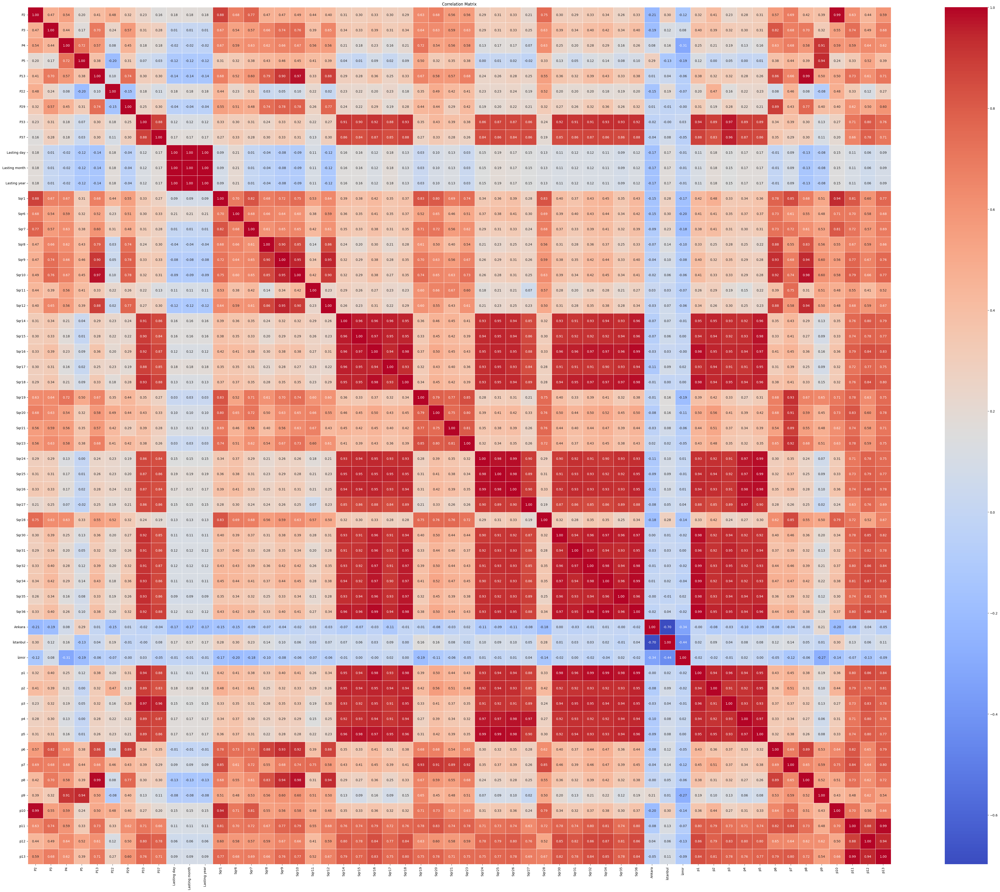

In [30]:
correlation(train_df)

In [31]:
 from sklearn.preprocessing import OneHotEncoder

In [32]:
# Transformer class to convert "City Group" feature into binary values
class City_Group(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        # No fitting required, return self
        return self
    
    def transform(self, X):
        # Convert "City Group" to binary: 1 for "Big Cities", 0 otherwise
        X["City Group"] = X["City Group"].apply(lambda x: 1 if x == "Big Cities" else 0)
        return X

# Transformer class to one-hot encode "Type" feature
class Type(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        # No fitting required, return self
        return self
    
    def transform(self, X):
        # Create dummy variables for "Type" feature
        dummies = pd.get_dummies(X["Type"])
        # Concatenate dummy variables with original DataFrame
        X = pd.concat([X, dummies], axis=1)
        # Drop the original "Type" column
        X.drop("Type", axis=1, inplace=True)
        return X

# Transformer class to one-hot encode "City" feature
class City(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        # No fitting required, return self
        return self
    
    def transform(self, X):
        # Create dummy variables for "City" feature
        dummies = pd.get_dummies(X["City"])
        # Concatenate dummy variables with original DataFrame
        X = pd.concat([X, dummies], axis=1)
        # Drop the original "City" column
        X.drop("City", axis=1, inplace=True)
        return X


In [33]:
pip = Pipeline([
    ("City_Group",City_Group()),
    ("Type",Type()),
    ("City",City())
])

In [34]:
train_df = train_df.drop("Day_Name",axis=1)

In [35]:
train_df.head(17)

,Id,City,City Group,Type,P2,P3,P4,P5,P13,P22,...,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13
0,0,İstanbul,Big Cities,IL,5.0,4.0,4.0,2,5.0,3,...,3.000000,3.414214,17.122417,10.114383,3.618034,6.0,3.500000,34.457537,16.195384,50.652921
1,1,Ankara,Big Cities,FC,5.0,4.0,4.0,1,5.0,3,...,0.000000,0.000000,17.358485,8.292529,3.618034,5.0,3.500000,26.251014,8.618034,34.869048
2,2,Ankara,Other,IL,4.0,2.0,5.0,2,5.0,1,...,0.000000,0.000000,15.676323,6.414214,3.618034,7.0,2.707107,22.290536,10.618034,32.908570
3,3,Ankara,Other,IL,4.5,6.0,6.0,4,7.5,1,...,3.162278,4.828427,27.815260,17.957571,5.331139,10.0,3.474745,56.797011,23.648117,80.445128
4,4,Ankara,Other,IL,4.0,3.0,4.0,2,5.0,2,...,3.968119,4.146264,16.358485,7.242641,3.618034,6.0,2.866025,31.199520,15.586153,46.785673
5,5,Ankara,Big Cities,FC,6.0,4.5,7.5,8,6.0,1,...,0.000000,0.000000,24.309837,14.554567,4.414214,15.5,4.224745,39.064404,19.914214,58.978617
6,6,İstanbul,Big Cities,IL,3.0,4.0,4.0,1,5.0,2,...,4.236068,6.236068,18.180340,7.828427,3.618034,5.0,2.207107,36.014122,15.599458,51.613580
7,7,İstanbul,Big Cities,IL,5.0,4.0,5.0,2,4.0,4,...,0.000000,0.000000,15.968119,10.528597,2.866025,7.0,3.500000,27.296716,9.866025,37.162741
8,8,Ankara,Other,IL,1.0,4.0,4.0,1,5.0,1,...,3.414214,5.000000,16.122417,6.414214,3.618034,5.0,1.000000,30.913901,15.444270,46.358171
9,9,İstanbul,Other,IL,4.5,6.0,7.5,6,7.5,1,...,0.000000,0.000000,23.149111,15.276661,5.331139,13.5,3.474745,38.625771,18.831139,57.456910


In [36]:
def encode_binary(dataframe, cols):
    """
    Encode categorical variables as binary.
    
    Args:
    - dataframe: Pandas DataFrame containing the dataset.
    - cols: List of columns to encode as binary.
    
    Returns:
    - Encoded DataFrame.
    """
    # Use pandas get_dummies to convert categorical variables to binary
    # drop_first=True removes the first level to avoid multicollinearity
    # dtype=int ensures the resulting columns are of integer type
    dataframe[cols] = pd.get_dummies(dataframe[cols], drop_first=True, dtype=int)
    return dataframe[cols]

# Encode "City Group" as binary for train_df
encode_binary(train_df, "City Group")

# Encode "City Group" as binary for test_df
encode_binary(test_df, "City Group")



0        1
1        1
2        0
3        1
4        1
        ..
99995    1
99996    1
99997    0
99998    0
99999    0
Name: City Group, Length: 100000, dtype: int64

In [37]:
train_df.drop("City",axis=1,inplace=True)

In [38]:
test_df.drop("City",axis=1,inplace=True)

In [39]:
train_df.head()

,Id,City Group,Type,P2,P3,P4,P5,P13,P22,P29,...,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13
0,0,0,IL,5.0,4.0,4.0,2,5.0,3,3.0,...,3.000000,3.414214,17.122417,10.114383,3.618034,6.0,3.500000,34.457537,16.195384,50.652921
1,1,0,FC,5.0,4.0,4.0,1,5.0,3,3.0,...,0.000000,0.000000,17.358485,8.292529,3.618034,5.0,3.500000,26.251014,8.618034,34.869048
2,2,1,IL,4.0,2.0,5.0,2,5.0,1,3.0,...,0.000000,0.000000,15.676323,6.414214,3.618034,7.0,2.707107,22.290536,10.618034,32.908570
3,3,1,IL,4.5,6.0,6.0,4,7.5,1,7.5,...,3.162278,4.828427,27.815260,17.957571,5.331139,10.0,3.474745,56.797011,23.648117,80.445128
4,4,1,IL,4.0,3.0,4.0,2,5.0,2,3.0,...,3.968119,4.146264,16.358485,7.242641,3.618034,6.0,2.866025,31.199520,15.586153,46.785673


In [40]:
test_df.head()

,Id,City Group,Type,P2,P3,P4,P5,P13,P22,P29,...,p4,p5,p6,p7,p8,p9,p10,p11,p12,p13
0,0,1,FC,4.0,4.0,4.0,1,4.0,1,3.0,...,0.0,0.0,17.122417,11.854468,2.866025,5.0,2.500000,29.459729,7.866025,37.325754
1,1,1,IL,4.0,4.0,4.0,2,5.0,2,3.0,...,0.0,0.0,16.382332,9.618400,3.500000,6.0,2.866025,26.400733,9.500000,35.900733
2,2,0,FC,4.0,4.0,4.0,2,5.0,5,3.0,...,0.0,0.0,16.886350,12.358485,3.618034,6.0,2.866025,30.244835,9.618034,39.862869
3,3,1,IL,4.0,4.0,4.0,2,5.0,2,3.0,...,0.0,0.0,17.204187,10.292529,3.500000,6.0,2.707107,28.296716,10.166667,38.463382
4,4,1,FC,4.0,4.0,4.0,1,4.0,1,3.0,...,0.0,0.0,16.886350,9.936238,3.118034,5.0,2.707107,27.022587,8.118034,35.140621


In [41]:
one_hot_encoded_train = pd.get_dummies(train_df['Type'])
one_hot_encoded_test = pd.get_dummies(test_df['Type'])

In [42]:
train_df = pd.concat([train_df, one_hot_encoded_train], axis=1)
test_df = pd.concat([test_df, one_hot_encoded_test], axis=1)

In [43]:
train_df.head()

,Id,City Group,Type,P2,P3,P4,P5,P13,P22,P29,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,0,0,IL,5.0,4.0,4.0,2,5.0,3,3.0,...,10.114383,3.618034,6.0,3.500000,34.457537,16.195384,50.652921,False,False,True
1,1,0,FC,5.0,4.0,4.0,1,5.0,3,3.0,...,8.292529,3.618034,5.0,3.500000,26.251014,8.618034,34.869048,False,True,False
2,2,1,IL,4.0,2.0,5.0,2,5.0,1,3.0,...,6.414214,3.618034,7.0,2.707107,22.290536,10.618034,32.908570,False,False,True
3,3,1,IL,4.5,6.0,6.0,4,7.5,1,7.5,...,17.957571,5.331139,10.0,3.474745,56.797011,23.648117,80.445128,False,False,True
4,4,1,IL,4.0,3.0,4.0,2,5.0,2,3.0,...,7.242641,3.618034,6.0,2.866025,31.199520,15.586153,46.785673,False,False,True


In [44]:
test_df.head()

,Id,City Group,Type,P2,P3,P4,P5,P13,P22,P29,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,0,1,FC,4.0,4.0,4.0,1,4.0,1,3.0,...,11.854468,2.866025,5.0,2.500000,29.459729,7.866025,37.325754,False,True,False
1,1,1,IL,4.0,4.0,4.0,2,5.0,2,3.0,...,9.618400,3.500000,6.0,2.866025,26.400733,9.500000,35.900733,False,False,True
2,2,0,FC,4.0,4.0,4.0,2,5.0,5,3.0,...,12.358485,3.618034,6.0,2.866025,30.244835,9.618034,39.862869,False,True,False
3,3,1,IL,4.0,4.0,4.0,2,5.0,2,3.0,...,10.292529,3.500000,6.0,2.707107,28.296716,10.166667,38.463382,False,False,True
4,4,1,FC,4.0,4.0,4.0,1,4.0,1,3.0,...,9.936238,3.118034,5.0,2.707107,27.022587,8.118034,35.140621,False,True,False


In [45]:
train_df.drop("Type",axis=1,inplace=True)

In [46]:
test_df.drop("Type",axis=1,inplace=True)

In [47]:
train_df['DT'] = train_df['DT'].replace({True: 1, False: 0})
train_df['FC'] = train_df['FC'].replace({True: 1, False: 0})
train_df['IL'] = train_df['IL'].replace({True: 1, False: 0})
test_df['DT'] = test_df['DT'].replace({True: 1, False: 0})
test_df['FC'] = test_df['FC'].replace({True: 1, False: 0})
test_df['IL'] = test_df['IL'].replace({True: 1, False: 0})

/tmp/ipykernel_27/2385453366.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df['DT'] = train_df['DT'].replace({True: 1, False: 0})
/tmp/ipykernel_27/2385453366.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df['FC'] = train_df['FC'].replace({True: 1, False: 0})
/tmp/ipykernel_27/2385453366.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior,

In [48]:
train_df.columns

Index(['Id', 'City Group', 'P2', 'P3', 'P4', 'P5', 'P13', 'P22', 'P29', 'P33',
       'P37', 'revenue', 'Day', 'Month', 'Years', 'Lasting day',
       'Lasting month', 'Lasting year', 'Sqr1', 'Sqr6', 'Sqr7', 'Sqr8', 'Sqr9',
       'Sqr10', 'Sqr11', 'Sqr12', 'Sqr14', 'Sqr15', 'Sqr16', 'Sqr17', 'Sqr18',
       'Sqr19', 'Sqr20', 'Sqr21', 'Sqr23', 'Sqr24', 'Sqr25', 'Sqr26', 'Sqr27',
       'Sqr28', 'Sqr30', 'Sqr31', 'Sqr32', 'Sqr34', 'Sqr35', 'Sqr36', 'Ankara',
       'İstanbul', 'İzmir', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8',
       'p9', 'p10', 'p11', 'p12', 'p13', 'DT', 'FC', 'IL'],
      dtype='object')

In [49]:
test_df.columns

Index(['Id', 'City Group', 'P2', 'P3', 'P4', 'P5', 'P13', 'P22', 'P29', 'P33',
       'P37', 'Day', 'Day_Name', 'Month', 'Years', 'Lasting day',
       'Lasting month', 'Lasting year', 'Sqr1', 'Sqr6', 'Sqr7', 'Sqr8', 'Sqr9',
       'Sqr10', 'Sqr11', 'Sqr12', 'Sqr14', 'Sqr15', 'Sqr16', 'Sqr17', 'Sqr18',
       'Sqr19', 'Sqr20', 'Sqr21', 'Sqr23', 'Sqr24', 'Sqr25', 'Sqr26', 'Sqr27',
       'Sqr28', 'Sqr30', 'Sqr31', 'Sqr32', 'Sqr34', 'Sqr35', 'Sqr36', 'Ankara',
       'İstanbul', 'İzmir', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8',
       'p9', 'p10', 'p11', 'p12', 'p13', 'DT', 'FC', 'IL'],
      dtype='object')

In [50]:
train_df.drop("Id",axis=1,inplace=True)
ids = test_df["Id"]
test_df.drop("Id",axis=1,inplace=True)

In [51]:
train_df.columns

Index(['City Group', 'P2', 'P3', 'P4', 'P5', 'P13', 'P22', 'P29', 'P33', 'P37',
       'revenue', 'Day', 'Month', 'Years', 'Lasting day', 'Lasting month',
       'Lasting year', 'Sqr1', 'Sqr6', 'Sqr7', 'Sqr8', 'Sqr9', 'Sqr10',
       'Sqr11', 'Sqr12', 'Sqr14', 'Sqr15', 'Sqr16', 'Sqr17', 'Sqr18', 'Sqr19',
       'Sqr20', 'Sqr21', 'Sqr23', 'Sqr24', 'Sqr25', 'Sqr26', 'Sqr27', 'Sqr28',
       'Sqr30', 'Sqr31', 'Sqr32', 'Sqr34', 'Sqr35', 'Sqr36', 'Ankara',
       'İstanbul', 'İzmir', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8',
       'p9', 'p10', 'p11', 'p12', 'p13', 'DT', 'FC', 'IL'],
      dtype='object')

In [52]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imputer=IterativeImputer(max_iter=10)
train_df[nums]=imputer.fit_transform(train_df[nums])
test_df[nums]=imputer.fit_transform(test_df[nums])

In [53]:
def scale(dataframe):
    """
    Scale numerical features using Min-Max Scaling.
    
    Args:
    - dataframe: Pandas DataFrame containing the dataset.
    
    Returns:
    - Scaled DataFrame.
    """
    # Initialize MinMaxScaler
    rob = MinMaxScaler()
    
    # Iterate over numerical columns
    for col in nums:  
        # Scale each numerical column using Min-Max Scaling
        scaled_data = rob.fit_transform(dataframe[[col]])
        # Update the column in the DataFrame with the scaled values
        dataframe[col] = scaled_data
    
    return dataframe

# Scale numerical features in train_df
scale(train_df)

# Scale numerical features in test_df
scale(test_df)

# Display the first few rows of the scaled train_df
train_df.head()


,City Group,P2,P3,P4,P5,P13,P22,P29,P33,P37,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,0,0.615385,0.533333,0.222222,0.142857,0.444444,0.50,0.4,0.833333,0.500,...,0.239086,0.451637,0.173913,0.557780,0.314929,0.446893,0.370621,0,0,1
1,0,0.615385,0.533333,0.222222,0.000000,0.444444,0.50,0.4,0.000000,0.000,...,0.133218,0.451637,0.086957,0.557780,0.119760,0.070151,0.088190,0,1,0
2,1,0.461538,0.266667,0.444444,0.142857,0.444444,0.00,0.4,0.000000,0.000,...,0.024070,0.451637,0.260870,0.380876,0.025571,0.169590,0.053110,0,0,1
3,1,0.538462,0.800000,0.666667,0.428571,1.000000,0.00,1.0,1.000000,0.750,...,0.694852,1.000000,0.521739,0.552146,0.846212,0.817439,0.903711,0,0,1
4,1,0.461538,0.400000,0.222222,0.142857,0.444444,0.25,0.4,0.333333,0.375,...,0.072210,0.451637,0.173913,0.416333,0.237446,0.416602,0.301422,0,0,1


Highly Correlated Features with Revenue (Correlation > 0.8):
[]

Correlation with Revenue:
P2               0.218221
P3               0.017881
P4               0.072821
P5               0.008286
P13             -0.042842
P22              0.111167
P29             -0.043341
P33              0.031044
P37              0.047089
Lasting day      0.327601
Lasting month    0.327601
Lasting year     0.327601
Sqr1             0.145774
Sqr6             0.205104
Sqr7             0.132093
Sqr8            -0.031667
Sqr9             0.006078
Sqr10           -0.017359
Sqr11            0.111491
Sqr12            0.000511
Sqr14            0.068489
Sqr15            0.056521
Sqr16            0.035700
Sqr17            0.108959
Sqr18            0.046956
Sqr19            0.090438
Sqr20            0.104687
Sqr21            0.174779
Sqr23            0.125759
Sqr24            0.068880
Sqr25            0.086259
Sqr26            0.054568
Sqr27            0.049725
Sqr28            0.261093
Sqr30            0.002699

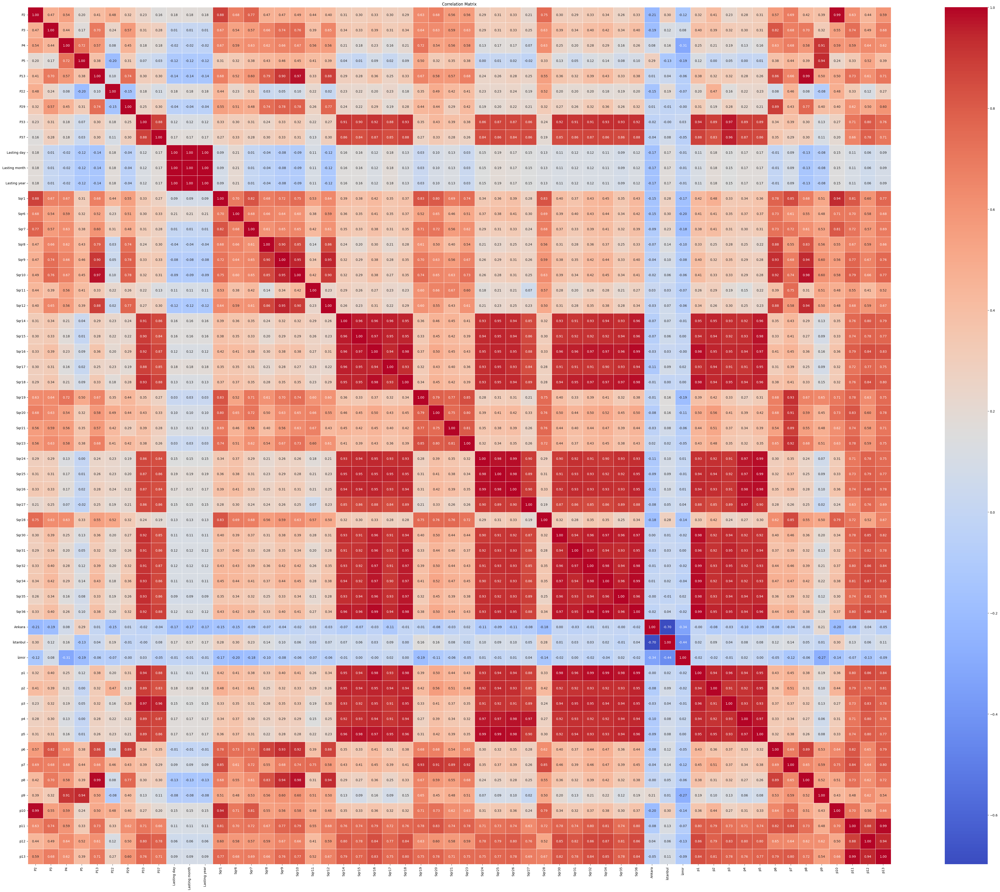

In [54]:
correlation(train_df)


Correlation Matrix:
                     P2        P3        P4        P5       P13       P22  \
P2             1.000000  0.239331  0.296117  0.187654  0.223462  0.239462   
P3             0.239331  1.000000  0.216735  0.173333  0.320913  0.101792   
P4             0.296117  0.216735  1.000000  0.405433  0.362588  0.046213   
P5             0.187654  0.173333  0.405433  1.000000  0.332373 -0.073949   
P13            0.223462  0.320913  0.362588  0.332373  1.000000 -0.026126   
P22            0.239462  0.101792  0.046213 -0.073949 -0.026126  1.000000   
P29            0.208198  0.276279  0.338850  0.323954  0.441095 -0.122416   
P33            0.126147  0.156039  0.111844  0.088579  0.084243  0.096759   
P37            0.103990  0.146831  0.099997  0.079043  0.096981  0.080159   
Lasting day    0.048892  0.021800 -0.026321 -0.044392 -0.052045  0.046552   
Lasting month  0.048892  0.021800 -0.026321 -0.044392 -0.052045  0.046552   
Lasting year   0.048892  0.021800 -0.026321 -0.044392 -

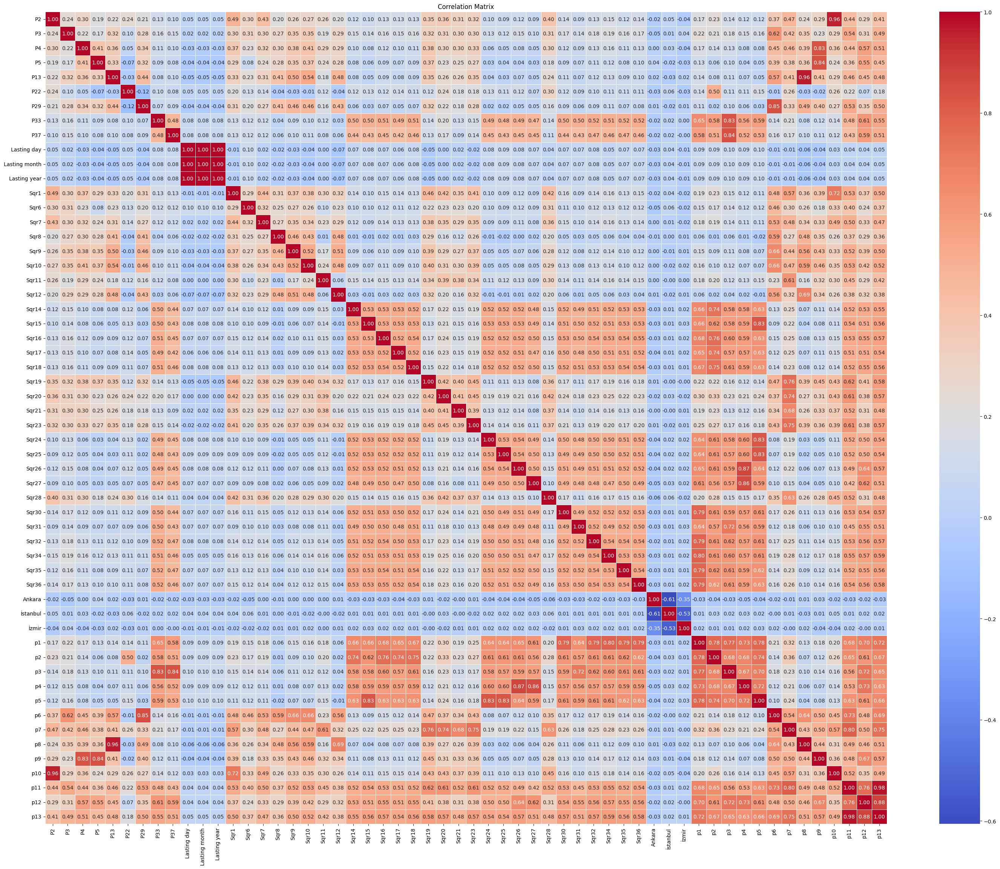

In [55]:
cor = test_df[nums].corr()
print("\nCorrelation Matrix:")
print(cor)

plt.figure(figsize=(36, 28))
sns.heatmap(cor, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [56]:
train_df.head()

,City Group,P2,P3,P4,P5,P13,P22,P29,P33,P37,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,0,0.615385,0.533333,0.222222,0.142857,0.444444,0.50,0.4,0.833333,0.500,...,0.239086,0.451637,0.173913,0.557780,0.314929,0.446893,0.370621,0,0,1
1,0,0.615385,0.533333,0.222222,0.000000,0.444444,0.50,0.4,0.000000,0.000,...,0.133218,0.451637,0.086957,0.557780,0.119760,0.070151,0.088190,0,1,0
2,1,0.461538,0.266667,0.444444,0.142857,0.444444,0.00,0.4,0.000000,0.000,...,0.024070,0.451637,0.260870,0.380876,0.025571,0.169590,0.053110,0,0,1
3,1,0.538462,0.800000,0.666667,0.428571,1.000000,0.00,1.0,1.000000,0.750,...,0.694852,1.000000,0.521739,0.552146,0.846212,0.817439,0.903711,0,0,1
4,1,0.461538,0.400000,0.222222,0.142857,0.444444,0.25,0.4,0.333333,0.375,...,0.072210,0.451637,0.173913,0.416333,0.237446,0.416602,0.301422,0,0,1


In [57]:
test_df.head()

,City Group,P2,P3,P4,P5,P13,P22,P29,P33,P37,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,1,0.461538,0.666667,0.363636,0.0,0.222222,0.00,0.3,0.0,0.0,...,0.317422,0.210919,0.190476,0.320069,0.260199,0.085510,0.175074,0,1,0
1,1,0.461538,0.666667,0.363636,0.2,0.444444,0.25,0.3,0.0,0.0,...,0.196185,0.413854,0.285714,0.398171,0.199233,0.155370,0.153231,0,0,1
2,0,0.461538,0.666667,0.363636,0.2,0.444444,1.00,0.3,0.0,0.0,...,0.344750,0.451637,0.285714,0.398171,0.275846,0.160417,0.213964,0,1,0
3,1,0.461538,0.666667,0.363636,0.2,0.444444,0.25,0.3,0.0,0.0,...,0.232736,0.413854,0.285714,0.364261,0.237020,0.183874,0.192512,0,0,1
4,1,0.461538,0.666667,0.363636,0.0,0.222222,0.00,0.3,0.0,0.0,...,0.213418,0.291587,0.190476,0.364261,0.211626,0.096285,0.141580,0,1,0


In [58]:
X = train_df.drop("revenue",axis=1)
y = train_df["revenue"]


In [59]:
from sklearn.decomposition import PCA

pca = PCA()
X_train = pca.fit_transform(X)

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Choose the number of components based on the explained variance threshold
n_components = np.argmax(cumulative_explained_variance >= 0.95) + 1

pca = PCA(n_components=n_components)

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.1)

In [61]:
train_df.head()

,City Group,P2,P3,P4,P5,P13,P22,P29,P33,P37,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,0,0.615385,0.533333,0.222222,0.142857,0.444444,0.50,0.4,0.833333,0.500,...,0.239086,0.451637,0.173913,0.557780,0.314929,0.446893,0.370621,0,0,1
1,0,0.615385,0.533333,0.222222,0.000000,0.444444,0.50,0.4,0.000000,0.000,...,0.133218,0.451637,0.086957,0.557780,0.119760,0.070151,0.088190,0,1,0
2,1,0.461538,0.266667,0.444444,0.142857,0.444444,0.00,0.4,0.000000,0.000,...,0.024070,0.451637,0.260870,0.380876,0.025571,0.169590,0.053110,0,0,1
3,1,0.538462,0.800000,0.666667,0.428571,1.000000,0.00,1.0,1.000000,0.750,...,0.694852,1.000000,0.521739,0.552146,0.846212,0.817439,0.903711,0,0,1
4,1,0.461538,0.400000,0.222222,0.142857,0.444444,0.25,0.4,0.333333,0.375,...,0.072210,0.451637,0.173913,0.416333,0.237446,0.416602,0.301422,0,0,1


In [62]:
def RSE(y_true, y_predicted):
    y_true = np.array(y_true)
    y_predicted = np.array(y_predicted)
    RSS = np.sum(np.square(y_true - y_predicted))

    rse = sqrt(RSS / (len(y_true) - 2))
    return rse

In [63]:
# List of models to evaluate
models = [
    LinearRegression(),
    RandomForestRegressor(n_estimators=42, n_jobs=-1),
    AdaBoostRegressor(),
    KNeighborsRegressor(),
    DecisionTreeRegressor(),
    GradientBoostingRegressor(),
    XGBRegressor(),
    LGBMRegressor(),
    CatBoostRegressor(),
    Lasso(),
    Ridge()
]

# Names of the models for reporting
model_names = [
    "LinearRegression",
    "RandomForestRegressor",
    "AdaBoostRegressor",
    "KNeighborsRegressor",
    "DecisionTreeRegressor",
    "GradientBoostingRegressor",
    "XGBRegressor",
    "LGBMRegressor",
    "CatBoostRegressor",
    "Lasso",
    "Ridge"
]

# Initialize lists to store evaluation metrics
MSE = []
r_2_test = []
r_2_train = []
RSE_ = []
accuracy = []
RMSE = []
MAE = []

# Iterate over each model
for model_idx in range(len(models)):
    model = models[model_idx]
    model.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = model.predict(X_test)
    
    # Perform cross-validation to evaluate the model
    C = cross_validate(model, X, y, cv=5, scoring=("neg_mean_squared_error", "neg_root_mean_squared_error", "neg_mean_absolute_error", "r2"), return_train_score=True)
    
    # Calculate and store evaluation metrics
    MSE.append((C["test_neg_mean_squared_error"] * -1).mean())
    MAE.append((C["test_neg_mean_absolute_error"] * -1).mean())
    r_2_train.append(C["train_r2"].mean())
    r_2_test.append(C["test_r2"].mean())
    RSE_.append(round(RSE(y_test, y_pred), 5))
    accuracy.append((model.score(X_test, y_test)) * 100)
    RMSE.append((C["test_neg_root_mean_squared_error"] * -1).mean())

# Create a DataFrame to report the model performance
model_report = pd.DataFrame({
    'Modelling Name': model_names,
    "Train R2": r_2_train,
    'MSE': MSE,
    "Test R2": r_2_test,
    "RSE": RSE_,
    "Accuracy": accuracy,
    "RMSE": RMSE,
    "MAE": MAE
})


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002104 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714
[LightGBM] [Info] Number of data points in the train set: 123, number of used features: 61
[LightGBM] [Info] Start training from score 15.188981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

In [64]:
model_report

,Modelling Name,Train R2,MSE,Test R2,RSE,Accuracy,RMSE,MAE
0,LinearRegression,0.527896,0.374029,-0.688027,0.58032,-19.735994,0.604138,0.479555
1,RandomForestRegressor,0.868491,0.196919,0.106857,0.55539,-9.670621,0.440227,0.342986
2,AdaBoostRegressor,0.709040,0.210555,0.038822,0.51267,6.552280,0.455511,0.352951
3,KNeighborsRegressor,0.261682,0.258713,-0.174351,0.64475,-47.798558,0.506154,0.411884
4,DecisionTreeRegressor,1.000000,0.299020,-0.444355,0.65146,-50.890800,0.545181,0.429107
5,GradientBoostingRegressor,0.979135,0.225655,-0.042024,0.57683,-18.301581,0.473060,0.375073
6,XGBRegressor,0.999997,0.244943,-0.118734,0.62167,-37.406362,0.491914,0.397300
7,LGBMRegressor,0.751680,0.226339,-0.038923,0.58969,-23.633038,0.470657,0.379891
8,CatBoostRegressor,0.999436,0.198216,0.089094,0.54453,-5.424113,0.440710,0.351711
9,Lasso,0.000000,0.230792,-0.020659,0.53068,-0.127076,0.476670,0.365062


In [65]:
# Dictionary containing models and their respective hyperparameter grids
models = {
    "RandomForest": RandomForestRegressor(),
    "SVR": SVR(),
    "CatBoost": CatBoostRegressor()
}

# Dictionary containing hyperparameter grids for each model
param_grid = {
    "RandomForest": {
        "n_estimators": [100, 150],
        "max_depth": [10, 15],
        "max_features": [None, 1.0],
        "n_jobs": [1, -1, None],
        "verbose": [0, 1, 2]
    },
    "SVR": {
        "kernel": ["rbf", "linear", "poly"],
        "C": [1.0, 0.5, 2.0, 5.0],
        "gamma": ["scale"]
    },
    "CatBoost": {
        "iterations": [100, 200],
        "learning_rate": [0.01, 0.001, 0.0001],
        'depth': [2, 6, 10],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]
    }
}


In [66]:
from sklearn.model_selection import KFold, GridSearchCV

In [67]:
# Cross-validation setup with KFold
cv = KFold(n_splits=10, shuffle=True)

# Dictionary to store grid search objects
grids = {}

# Iterate over each model
for model_name, model in models.items():
    # Perform grid search for hyperparameter tuning
    grids[model_name] = GridSearchCV(estimator=model, param_grid=param_grid[model_name], cv=cv, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)
    grids[model_name].fit(X_train, y_train)
    
    # Get the best parameters and best RMSE score
    best_params = grids[model_name].best_params_
    best_score = np.sqrt(-1 * grids[model_name].best_score_)
    
    # Print the best parameters and best RMSE score for each model
    print(f'Best parameters for {model_name}: {best_params}')
    print(f'Best RMSE for {model_name}: {best_score}\n')


Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=0; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=0; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=0; total time=   0.4s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=1; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=1; total time=   0.6s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
build

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.

[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=0; total time=   0.4s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=0; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=1; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=1; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=1, verbose=1; total time=   0.6s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
build

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parall

[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=-1, verbose=1; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=-1, verbose=1; total time=   0.5s
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=-1, verbose=1; total time=   0.5s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building t

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s


building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=-1, verbose=2; total time=   0.5s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

building tree 100 of 100
[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=None, verbose=2; total time=   0.5s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


[CV] END max_depth=10, max_features=None, n_estimators=100, n_jobs=None, verbose=2; total time=   0.5s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 o

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: 

building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150


[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s


building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 

building tree 116 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=10, max_features=None, n_estimators=150, n_jobs=-1, verbose=2; total time=   0.8s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building 

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel

building tree 116 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=10, max_features=None, n_estimators=150, n_jobs=-1, verbose=2; total time=   0.8s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
buildin

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
buildi

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s



building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82 of 150
building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
b

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Do

building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend Threading

[CV] END max_depth=10, max_features=None, n_estimators=150, n_jobs=None, verbose=2; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=1, verbose=0; total time=   0.5s
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=1, verbose=0; total time=   0.5s
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=1, verbose=1; total time=   0.4s
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=1, verbose=1; total time=   0.5s
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=1, verbose=1; total time=   0.5s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
bui

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s


building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=1, verbose=2; total t

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | ela

building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 85 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=2; total time=   0.8s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=2; total time=   0.8s
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=None, verbose=0; total time=   0.4s
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=None, verbose=0; total time=   0.4s

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=None, verbose=2; total time=   0.5s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 o

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=10, max_features=1.0, n_estimators=100, n_jobs=None, verbose=2; total time=   0.5s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=1, verbose=0; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=1, verbose=0; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=1, verbose=0; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=1, verbose=1; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=1, verbose=1; total time=   0.7s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend 


building tree 54 of 150
building tree 55 of 150
building tree 56 of 150
building tree 57 of 150
building tree 58 of 150
building tree 59 of 150
building tree 60 of 150
building tree 61 of 150
building tree 62 of 150
building tree 63 of 150
building tree 64 of 150
building tree 65 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82 of 150
building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 9

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 54 of 150
building tree 55 of 150
building tree 56 of 150
building tree 57 of 150
building tree 58 of 150
building tree 59 of 150
building tree 60 of 150
building tree 61 of 150
building tree 62 of 150
building tree 63 of 150
building tree 64 of 150
building tree 65 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82 of 150
building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.

building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=1, verbose=2; total time=   0.6s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=-1, verbose=0; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=-1, verbose=0; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=-1, verbose=0; total time=   0.7s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=-1, verbose=1; total time=   0.8s
[CV] END max_depth=10, max_features=1.0, n_estimators=150, n_jobs=-1, verbose=1; total time=   0.7s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 o

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)

building tree 62 of 150
building tree 63 of 150
building tree 64 of 150
building tree 65 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82 of 150
building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | ela

building tree 62 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82 of 150
building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building t

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 1 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150
building tree 38 of 150
building tree 39 of 150
building tree 40 of 150
building tree 41 of 150
building tree 42 of 150
building tree 43 of 150
building tree 44 of 150
building tree 45 of 150
building tree 46 of 150
building tree 47 of 150
building tree 48 of 150
building tree 49 of 150
building tree 50 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 91 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
build

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Do

building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150
building tree 38 of 150
building tree 39 of 150
building tree 40 of 150
building tree 41 of 150
building tree 42 of 150
building tree 43 of 150
building tree 44 of 150
building tree 45 of 150
building tree 46 of 150
building tree 47 of 150
building tree 48 of 150
building tree 49 of 150
building tree 50 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150
building tree 38 of 150
building tree 39 of 150
building tree 40 of 150
building tree 41 of 150
building tree 42 of 150
building tree 43 of 150
building tree 44 of 150
building tree 45 of 150
building tree 46 of 1

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingB

building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
b

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_

building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Pa

building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=15, max_features=Non

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 t

building tree 25 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=15, max_features=None, n_estimators=100, n_jobs=-1, verbose=2; total time=   0.5s
[CV] END max_depth=15, max_features=None, n_estimators=100, n_jobs=None, verbose=0; total time=   0.5s
[CV] END max_depth=15, max_

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Do

building tree 68 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=15, max_features=None, n_estimators=100, n_jobs=-1, verbose=2; total time=   0.6s
[CV] END max_depth=15, max_features=None, n_estimators=100, n_jobs=None, verbose=0; total time=   0.5s
[CV] END max_depth=15, max_features=None, n_estimat

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=15, max_features=None, n_estimators=100, n_jobs=None, verbose=2; total time=   0.5s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=1, verbose=0; total time=   0.8s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=1, verbose=0; total time=   1.1s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=1, verbose=1; total time=   0.7s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=1, verbose=1; total time=   0.7s
[CV] END max_dep

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s


building tree 55 of 150
building tree 56 of 150
building tree 57 of 150
building tree 58 of 150
building tree 59 of 150
building tree 60 of 150
building tree 61 of 150
building tree 62 of 150
building tree 63 of 150
building tree 64 of 150
building tree 65 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82 of 150
building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.5s finished
[Parallel(n_jobs=4)]: U

building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=1, verbose=2; total time=   0.7s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree

[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s


building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
bui

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.5s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent w


building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=1, verbose=2; total time=   0.7s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=-1, verbose=0; total time=   0.8s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=-1, verbose=0; total time=   0.7s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=-1, verbose=0; total time=   0.8s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=-1, verbose=1; total time=   0.8s
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=-1, verbose=1; total time=   0.7s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
buil

[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s


building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 12

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_

[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=-1, verbose=2; total time=   0.8s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150
building tree 38 of 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 105 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=-1, verbose=2; total time=   0.7s
building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 92 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
bui

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s


building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=15, ma

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Do

building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150
building tree 38 of 150
building tree 39 of 150
building tree 40 of 150
building tree 41 of 150
building tree 42 of 150
building tree 43 of 150
building tree 44 of 150
building tree 45 of 15

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 1 of 150
building tree 2 of 150
building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150
building tree 38 of 150
building tree 39 of 150
building tree 40 of 150
building tree 41 of 150
building tree 42 of 150
b

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=15, max_features=None, n_estimators=150, n_jobs=None, verbose=2; total time=   0.7s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=1, verbose=0; total time=   0.5s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=1, verbose=0; total time=   0.5s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=1, verbose=1; total time=   0.4s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=1, verbose=1; total time=   0.4s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent work

building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 o

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.

building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66 of 100
building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)

[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=1, verbose=2; total time=   0.5s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=0; total time=   0.6s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=0; total time=   0.6s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=1; total time=   0.5s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=1; total time=   0.5s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=1; total time=   0.5s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
bu

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 17 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Do

building tree 67 of 100
building tree 68 of 100
building tree 69 of 100
building tree 70 of 100
building tree 71 of 100
building tree 72 of 100
building tree 73 of 100
building tree 74 of 100
building tree 75 of 100
building tree 76 of 100
building tree 77 of 100
building tree 78 of 100
building tree 79 of 100
building tree 80 of 100
building tree 81 of 100
building tree 82 of 100
building tree 83 of 100
building tree 84 of 100
building tree 85 of 100
building tree 86 of 100
building tree 87 of 100
building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=-1, verbose=2; total time=   0.5s
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=None, verbose=0; 

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 88 of 100
building tree 89 of 100
building tree 90 of 100
building tree 91 of 100
building tree 92 of 100
building tree 93 of 100
building tree 94 of 100
building tree 95 of 100
building tree 96 of 100
building tree 97 of 100
building tree 98 of 100
building tree 99 of 100
building tree 100 of 100
[CV] END max_depth=15, max_features=1.0, n_estimators=100, n_jobs=None, verbose=2; total time=   0.4s
building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 o

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s


building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100
building tree 45 of 100
building tree 46 of 100
building tree 47 of 100
building tree 48 of 100
building tree 49 of 100
building tree 50 of 100
building tree 51 of 100
building tree 52 of 100
building tree 53 of 100
building tree 54 of 100
building tree 55 of 100
building tree 56 of 100
building tree 57 of 100
building tree 58 of 100
building tree 59 of 100
building tree 60 of 100
building tree 61 of 100
building tree 62 of 100
building tree 63 of 100
building tree 64 of 100
building tree 65 of 100
building tree 66

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.2s


building tree 54 of 150
building tree 55 of 150
building tree 56 of 150
building tree 57 of 150
building tree 58 of 150
building tree 59 of 150
building tree 60 of 150
building tree 61 of 150
building tree 62 of 150
building tree 63 of 150
building tree 64 of 150
building tree 65 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82 of 150
building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: D


building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
bu

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s


building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 1

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished


building tree 83 of 150
building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123

[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s f

building tree 84 of 150
building tree 85 of 150
building tree 86 of 150
building tree 87 of 150
building tree 88 of 150
building tree 89 of 150
building tree 90 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 12

[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=4)]: Done 150 out of 150 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elap

building tree 93 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
build

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 88 of 150
building tree 91 of 150
building tree 92 of 150
building tree 93 of 150
building tree 94 of 150
building tree 95 of 150
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building t

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s


building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150
building tree 141 of 150
building tree 142 of 150
building tree 143 of 150
building tree 144 of 150
building tree 145 of 150
building tree 146 of 150
building tree 147 of 150
building tree 148 of 150
building tree 149 of 150
building tree 150 of 150
[CV] END max_depth=15, max_features=1.0, n_estimators=150, n_jobs=-1, verbose=2; total time=   0.7s
[CV] END max_depth=15, max_features=1.0, n_estimators=150, n_jobs=None, verbose=0; total time=   0.7s
[CV] END max_depth=15, max_features=1.0, n_estimators=150, n_jobs=None, verbose=0; total time=   0.7s
[CV] END max_depth=15, max_features=1.0, n_estimators=150, n_jobs=None, verbose=1; total time=   0.7s
[CV] END max_depth=15, max_features=1.0, n_estimators=150, n_jobs=None, verbose=1; total time=   0.7s
[CV] END max_depth=15, max_features=1.0, n

[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.1s


building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 of 150
building tree 120 of 150
building tree 121 of 150
building tree 122 of 150
building tree 123 of 150
building tree 124 of 150
building tree 125 of 150
building tree 126 of 150
building tree 127 of 150
building tree 128 of 150
building tree 129 of 150
building tree 130 of 150
building tree 131 of 150
building tree 132 of 150
building tree 133 of 150
building tree 134 of 150
building tree 135 of 150
building tree 136 of 150
building tree 137 of 150
building tree 138 of 150
building tree 139 of 150
building tree 140 of 150


[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s


Best parameters for RandomForest: {'max_depth': 15, 'max_features': None, 'n_estimators': 100, 'n_jobs': None, 'verbose': 1}
Best RMSE for RandomForest: 0.4302946383433651

Fitting 10 folds for each of 12 candidates, totalling 120 fits
Best parameters for SVR: {'C': 5.0, 'gamma': 'scale', 'kernel': 'poly'}
Best RMSE for SVR: 0.4808676367606671

Fitting 10 folds for each of 72 candidates, totalling 720 fits
building tree 96 of 150
building tree 97 of 150
building tree 98 of 150
building tree 99 of 150
building tree 100 of 150
building tree 101 of 150
building tree 102 of 150
building tree 103 of 150
building tree 104 of 150
building tree 105 of 150
building tree 106 of 150
building tree 107 of 150
building tree 108 of 150
building tree 109 of 150
building tree 110 of 150
building tree 111 of 150
building tree 112 of 150
building tree 113 of 150
building tree 114 of 150
building tree 115 of 150
building tree 116 of 150
building tree 117 of 150
building tree 118 of 150
building tree 119 o

In [68]:
from sklearn.metrics import mean_squared_error
for i in grids.keys():
    print (i + ': ' + str(np.sqrt(mean_squared_error(grids[i].predict(X_test), y_test))))

RandomForest: 0.5150075406644645
SVR: 0.4917184984451924
CatBoost: 0.46956721488177827


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


In [69]:
test_df = test_df.drop("Day_Name",axis=1)

In [70]:
train_df.head()

,City Group,P2,P3,P4,P5,P13,P22,P29,P33,P37,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,0,0.615385,0.533333,0.222222,0.142857,0.444444,0.50,0.4,0.833333,0.500,...,0.239086,0.451637,0.173913,0.557780,0.314929,0.446893,0.370621,0,0,1
1,0,0.615385,0.533333,0.222222,0.000000,0.444444,0.50,0.4,0.000000,0.000,...,0.133218,0.451637,0.086957,0.557780,0.119760,0.070151,0.088190,0,1,0
2,1,0.461538,0.266667,0.444444,0.142857,0.444444,0.00,0.4,0.000000,0.000,...,0.024070,0.451637,0.260870,0.380876,0.025571,0.169590,0.053110,0,0,1
3,1,0.538462,0.800000,0.666667,0.428571,1.000000,0.00,1.0,1.000000,0.750,...,0.694852,1.000000,0.521739,0.552146,0.846212,0.817439,0.903711,0,0,1
4,1,0.461538,0.400000,0.222222,0.142857,0.444444,0.25,0.4,0.333333,0.375,...,0.072210,0.451637,0.173913,0.416333,0.237446,0.416602,0.301422,0,0,1


In [71]:
test_df.head()

,City Group,P2,P3,P4,P5,P13,P22,P29,P33,P37,...,p7,p8,p9,p10,p11,p12,p13,DT,FC,IL
0,1,0.461538,0.666667,0.363636,0.0,0.222222,0.00,0.3,0.0,0.0,...,0.317422,0.210919,0.190476,0.320069,0.260199,0.085510,0.175074,0,1,0
1,1,0.461538,0.666667,0.363636,0.2,0.444444,0.25,0.3,0.0,0.0,...,0.196185,0.413854,0.285714,0.398171,0.199233,0.155370,0.153231,0,0,1
2,0,0.461538,0.666667,0.363636,0.2,0.444444,1.00,0.3,0.0,0.0,...,0.344750,0.451637,0.285714,0.398171,0.275846,0.160417,0.213964,0,1,0
3,1,0.461538,0.666667,0.363636,0.2,0.444444,0.25,0.3,0.0,0.0,...,0.232736,0.413854,0.285714,0.364261,0.237020,0.183874,0.192512,0,0,1
4,1,0.461538,0.666667,0.363636,0.0,0.222222,0.00,0.3,0.0,0.0,...,0.213418,0.291587,0.190476,0.364261,0.211626,0.096285,0.141580,0,1,0


In [72]:
SVR = grids["SVR"].predict(test_df)

In [73]:
Forest = grids["RandomForest"].predict(test_df)

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.3s


In [74]:
CAT = grids["CatBoost"].predict(test_df)

In [75]:
SupportVector = pd.DataFrame({"Id":ids,"Prediction":SVR})
RandomForest = pd.DataFrame({"Id":ids,"Prediction":Forest})
CatBoost = pd.DataFrame({"Id":ids,"Prediction":CAT})

In [76]:
SupportVector["Prediction"]=np.exp(SupportVector["Prediction"])
RandomForest["Prediction"]=np.exp(RandomForest["Prediction"])
CatBoost["Prediction"]=np.exp(CatBoost["Prediction"])

In [77]:
SupportVector

,Id,Prediction
0,0,3.910684e+06
1,1,3.906351e+06
2,2,3.910250e+06
3,3,3.883978e+06
4,4,3.910934e+06
...,...,...
99995,99995,3.946739e+06
99996,99996,3.906403e+06
99997,99997,3.915151e+06
99998,99998,3.891504e+06


In [78]:
RandomForest

,Id,Prediction
0,0,4.104437e+06
1,1,3.471321e+06
2,2,3.023214e+06
3,3,3.264620e+06
4,4,3.683582e+06
...,...,...
99995,99995,5.346922e+06
99996,99996,3.123666e+06
99997,99997,3.059350e+06
99998,99998,3.476877e+06


In [79]:
CatBoost

,Id,Prediction
0,0,4.019480e+06
1,1,3.551988e+06
2,2,3.266272e+06
3,3,3.171755e+06
4,4,3.430841e+06
...,...,...
99995,99995,4.817989e+06
99996,99996,3.214960e+06
99997,99997,3.748272e+06
99998,99998,3.784484e+06


In [80]:
Predictions=pd.DataFrame({"Id":ids,"Prediction":(CatBoost["Prediction"]+RandomForest["Prediction"])/2})

In [81]:
Predictions

,Id,Prediction
0,0,4.061959e+06
1,1,3.511655e+06
2,2,3.144743e+06
3,3,3.218188e+06
4,4,3.557212e+06
...,...,...
99995,99995,5.082456e+06
99996,99996,3.169313e+06
99997,99997,3.403811e+06
99998,99998,3.630680e+06


In [82]:
Predictions

,Id,Prediction
0,0,4.061959e+06
1,1,3.511655e+06
2,2,3.144743e+06
3,3,3.218188e+06
4,4,3.557212e+06
...,...,...
99995,99995,5.082456e+06
99996,99996,3.169313e+06
99997,99997,3.403811e+06
99998,99998,3.630680e+06


In [83]:
Predictions.to_csv("submission.csv",index=False)